In [3]:
import numpy as np

INSTALL REQUERIMENTS

In [2]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 16403, done.
remote: Counting objects: 100% (297/297), done.
remote: Compressing objects: 100% (219/219), done.
remote: Total 16403 (delta 154), reused 163 (delta 78), pack-reused 16106
Receiving objects: 100% (16403/16403), 15.10 MiB | 8.70 MiB/s, done.
Resolving deltas: 100% (11192/11192), done.
/content/yolov5/yolov5
Setup complete. Using torch 2.1.0+cu121 (Tesla T4)


In [4]:
# Montar Google Drive en Colab
from google.colab import drive
drive.mount('/content/drive')

# Ruta a la carpeta en Google Drive
folder_path = '/content/drive/MyDrive/YOLOV5/'
!unzip -q /content/drive/MyDrive/YOLOV5/data.zip -d /content/

Mounted at /content/drive


TRAIN MODEL

In [6]:
!python train.py --img 640 --batch 4 --epochs 1000 --data /content/drive/MyDrive/YOLOV5/custom2.yaml --weights yolov5x.pt --cache

2024-01-30 16:45:17.941154: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-30 16:45:17.941210: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-30 16:45:17.943183: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5x.pt, cfg=, data=/content/drive/MyDrive/YOLOV5/custom2.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=1000, batch_size=4, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_sca

Si se tiene una **precisión** cercana a 1 significa que hay una alta probabilidad de que lo que sea que el clasificador predice como una detección positiva es en verdad una predicción correcta.

Si se tiene un **recall** cercano a 1 significa que casi todos los objetos que están en la base de datos serán
encontrados por el modelo. Captura las instancias (debemos mirar este para cumplir el objetivo del proyecto?)

El **mAP** es tomar el valor promedio de la precisión en todos los valores de recall para todas las
clases, variando el umbral de IOU. En pocas palabras, Es una métrica que evalúa la calidad general de las detecciones a través de diferentes umbrales de confianza. Cuadro delimitador predicho y cuadro delimitador verdadero

se descargó un pdf guardado como: TG_1816_Deteccion y seguimiento de personas_Montoya. En donde se explican las medidias de rendimiento como lo es mAP50 Y mAP50-95. esto esta en la pagina 11 sección 2.3.4.
Pagina 12 se habla de precisión y recall

PRUEBA PARA VERIFICAR SU FUNCIONAMIENTO.

In [7]:
import torch
from IPython.display import Image, clear_output
!python detect.py --weights /content/yolov5/yolov5/runs/train/exp2/weights/best.pt --img 640 --conf 0.1 --source "/content/drive/MyDrive/YOLOV5/prueba2.PNG"
Image(filename= '/content/drive/MyDrive/YOLOV5/prueba2.PNG' ,width=600)
#el exp del weight es donde se guardo el mejor modelo, eso lo dice la sección de arriba runs/train/exp2,3,4..
#en image va donde donde se guardo esa imagen runs/detect/exp5

Output hidden; open in https://colab.research.google.com to view.

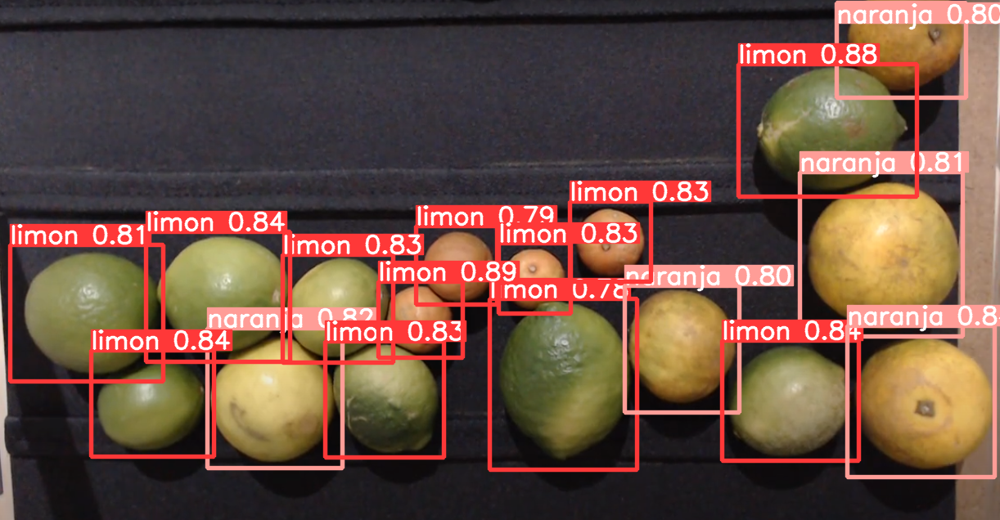

In [8]:
Image(filename= '/content/yolov5/yolov5/runs/detect/exp/prueba2.PNG' ,width=600)

In [10]:
!python detect.py --weights /content/yolov5/yolov5/runs/train/exp2/weights/best.pt --img 640 --conf 0.1 --source /content/drive/MyDrive/YOLOV5/video_copia_limones.mp4

detect: weights=['/content/yolov5/yolov5/runs/train/exp2/weights/best.pt'], source=/content/drive/MyDrive/YOLOV5/video_copia_limones.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-282-g9cdbd1de Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 322 layers, 86180143 parameters, 0 gradients, 203.8 GFLOPs
video 1/1 (1/580) /content/drive/MyDrive/YOLOV5/video_copia_limones.mp4: 384x640 14 limons, 2 naranjas, 83.0ms
video 1/1 (2/580) /content/drive/MyDrive/YOLOV5/video_copia_limones.mp4: 384x640 15 limons, 2 naranjas, 56.5ms
video 1/1 (3/580) /content/drive/MyDrive/YOLOV5/

In [ ]:
from IPython.display import Video
video_path = '/content/yolov5/yolov5/runs/detect/exp2/video_copia_limones.mp4'
Video(video_path, width=600)

In [11]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

In [12]:
!python val.py --weights /content/yolov5/yolov5/runs/train/exp2/weights/best.pt --data /content/drive/MyDrive/YOLOV5/custom2.yaml --img 640

val: data=/content/drive/MyDrive/YOLOV5/custom2.yaml, weights=['/content/yolov5/yolov5/runs/train/exp2/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-282-g9cdbd1de Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 322 layers, 86180143 parameters, 0 gradients, 203.8 GFLOPs
val: Scanning /content/data/labels/val.cache... 10 images, 0 backgrounds, 0 corrupt: 100% 10/10 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95:   0% 0/1 [00:00<?, ?it/s]WARNING ⚠️ NMS time limit 1.000s exceeded
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 1/1 [00:02<00:00,  2.85s/it]
                 

A CONTINUACIÓN ESTA EL CÓDIGO DE PRUEBA PARA MANEJAR SMOTE.

In [2]:
# Clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")


Cloning into 'yolov5'...
remote: Enumerating objects: 16403, done.
remote: Counting objects: 100% (297/297), done.
remote: Compressing objects: 100% (216/216), done.
remote: Total 16403 (delta 153), reused 171 (delta 81), pack-reused 16106
Receiving objects: 100% (16403/16403), 15.16 MiB | 19.63 MiB/s, done.
Resolving deltas: 100% (11190/11190), done.
/content/yolov5/yolov5
Setup complete. Using torch 2.1.0+cu121 (Tesla T4)


In [ ]:
# Montar Google Drive en Colab
from google.colab import drive
drive.mount('/content/drive')

# Ruta a la carpeta en Google Drive
folder_path = '/content/drive/MyDrive/YOLOV5/'

# Unzip data
!unzip -q /content/drive/MyDrive/YOLOV5/data.zip -d /content/

# Install imbalanced-learn
!pip install -U imbalanced-learn

# Load your dataset
import cv2
import numpy as np
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

Mounted at /content/drive
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 257.7/257.7 kB 5.5 MB/s eta 0:00:00
  Attempting uninstall: imbalanced-learn
    Found existing installation: imbalanced-learn 0.10.1
    Uninstalling imbalanced-learn-0.10.1:
      Successfully uninstalled imbalanced-learn-0.10.1


In [ ]:
def load_your_dataset(data_folder='/content/drive/MyDrive/YOLOV5/data', target_size=(224, 224)):
    train_images_folder = os.path.join('/content/data/images/train')
    train_labels_folder = os.path.join('/content/data/labels/train')

    val_images_folder = os.path.join('/content/data/images/val')
    val_labels_folder = os.path.join('/content/data/labels/val')

    X_train = []  # Lista para almacenar las imágenes
    y_train = []  # Lista para almacenar las etiquetas

    X_val = []
    y_val = []

    for image_name in os.listdir(train_images_folder):
        image_path = os.path.join(train_images_folder, image_name)

        # Cargar imagen con OpenCV y redimensionar
        image = cv2.imread(image_path)
        image = cv2.resize(image, target_size)
        X_train.append(image)

        # Cargar etiquetas (suponiendo que las etiquetas están en archivos de texto)
        label_path = os.path.join(train_labels_folder, image_name.replace('.PNG', '.txt'))
        with open(label_path, 'r') as file:
            labels = [list(map(float, line.strip().split())) for line in file.readlines()]
        y_train.append(labels)

    # Cargar datos de validación
    for image_name in os.listdir(val_images_folder):
        image_path = os.path.join(val_images_folder, image_name)

        # Cargar imagen con OpenCV y redimensionar
        image = cv2.imread(image_path)
        image = cv2.resize(image, target_size)
        X_val.append(image)

        # Cargar etiquetas (suponiendo que las etiquetas están en archivos de texto)
        label_path = os.path.join(val_labels_folder, image_name.replace('.PNG', '.txt'))
        with open(label_path, 'r') as file:
            labels = [list(map(float, line.strip().split())) for line in file.readlines()]
        y_val.append(labels)

    return np.array(X_train), np.array(y_train), np.array(X_val), np.array(y_val)


folder_path = '/content/drive/MyDrive/YOLOV5/'
X_train, y_train, X_val, y_val = load_your_dataset(folder_path)

print("Shape of X_train:", X_train.shape)
print("Shape of X_train_resampled:", X_train_resampled.shape)




Shape of X_train: (45, 224, 224, 3)
Shape of X_train_resampled: (45, 1)


<ipython-input-19-b39610cfb098>:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(X_train), np.array(y_train), np.array(X_val), np.array(y_val)


In [ ]:
import numpy as np

if not isinstance(X_train, np.ndarray):
    X_train = np.array(X_train)


y_train = np.array(y_train)
if len(y_train.shape) == 1:
    y_train = y_train.reshape(-1, 1)

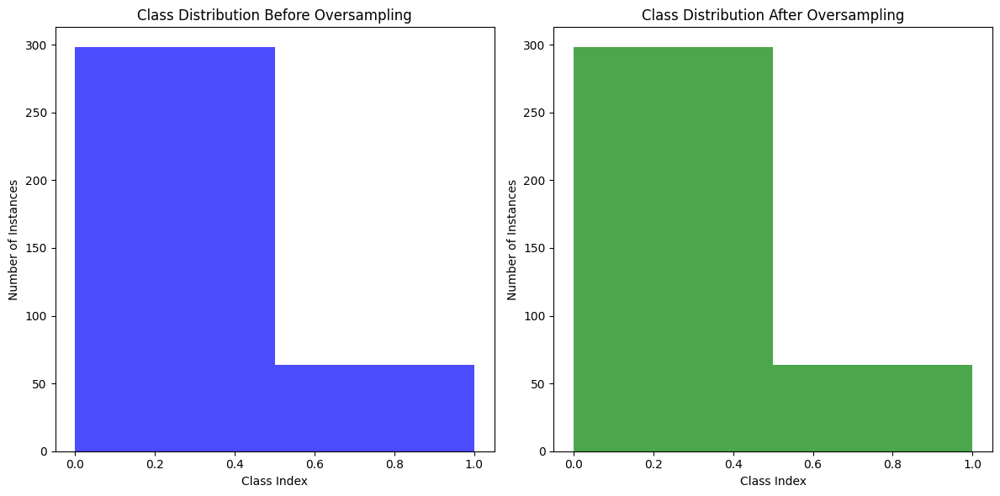

Número total de instancias por clase antes del oversampling: [10, 17, 8, 7, 6, 6, 5, 6, 8, 15, 11, 7, 8, 7, 5, 5, 6, 20, 6, 8, 12, 6, 8, 7, 6, 9, 8, 8, 12, 7, 9, 6, 10, 5, 4, 6, 6, 5, 9, 6, 9, 7, 11, 8, 7]
Número de instancias por clase después de filtrar clases minoritarias: [10 17  8  7  6  6  5  6  8 15 11  7  8  7  5  5  6 20  6  8 12  6  8  7
  6  9  8  8 12  7  9  6 10  5  4  6  6  5  9  6  9  7 11  8  7]
Clases minoritarias con suficientes instancias: [34]
Procesando clase 34
Número total de instancias por clase después del oversampling: [10, 17, 8, 7, 6, 6, 5, 6, 8, 15, 11, 7, 8, 7, 5, 5, 6, 20, 6, 8, 12, 6, 8, 7, 6, 9, 8, 8, 12, 7, 9, 6, 10, 5, 4, 6, 6, 5, 9, 6, 9, 7, 11, 8, 7]
Oversampling aplicado correctamente.
Número de instancias por clase antes del oversampling: [10, 17, 8, 7, 6, 6, 5, 6, 8, 15, 11, 7, 8, 7, 5, 5, 6, 20, 6, 8, 12, 6, 8, 7, 6, 9, 8, 8, 12, 7, 9, 6, 10, 5, 4, 6, 6, 5, 9, 6, 9, 7, 11, 8, 7]
Número de instancias por clase después del oversampling: [10, 17, 8

<ipython-input-78-865d514eb12b>:60: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices_class = np.where(y_np == class_idx)[0]


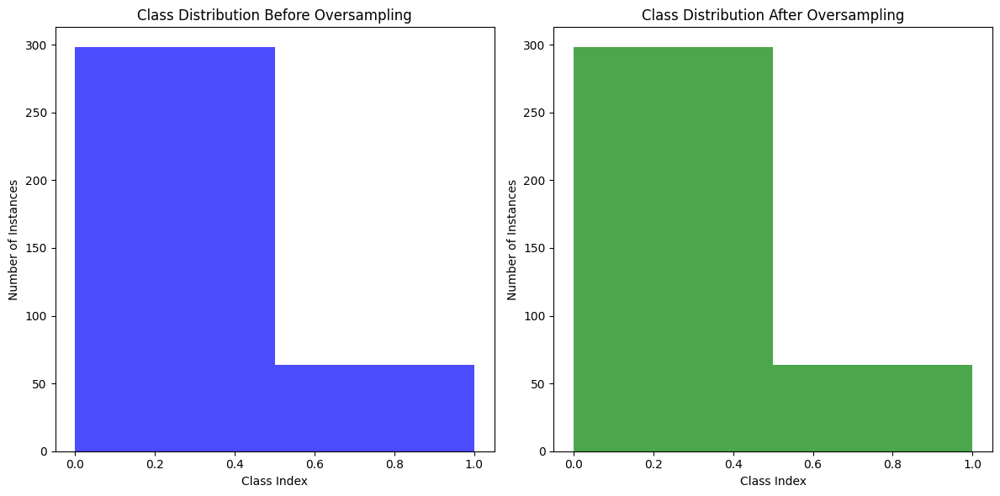

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define la función plot_class_distribution
import matplotlib.pyplot as plt
import numpy as np

def plot_class_distribution(y_before, y_after):
    # Flatten the nested lists
    y_before_flat = [item for sublist in y_before for item in sublist]
    y_after_flat = [item for sublist in y_after for item in sublist]

    # Convert to NumPy arrays
    y_before_np = np.array(y_before_flat)
    y_after_np = np.array(y_after_flat)

    # Get the number of classes
    num_classes_before = len(np.unique(y_before_np[:, 0]))
    num_classes_after = len(np.unique(y_after_np[:, 0]))
    num_classes = max(num_classes_before, num_classes_after)

    # Plot the class distribution before and after oversampling
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.hist(y_before_np[:, 0], bins=num_classes, color='blue', alpha=0.7)
    plt.title('Class Distribution Before Oversampling')
    plt.xlabel('Class Index')
    plt.ylabel('Number of Instances')

    plt.subplot(1, 2, 2)
    plt.hist(y_after_np[:, 0], bins=num_classes, color='green', alpha=0.7)
    plt.title('Class Distribution After Oversampling')
    plt.xlabel('Class Index')
    plt.ylabel('Number of Instances')

    plt.tight_layout()
    plt.show()

# Call the function to visualize the class distribution
plot_class_distribution(y_train, y_train_resampled)

def ml_ros(X, y, oversampling_factor=2, threshold_instances=5):
    # Convertir y a un array de numpy con tipo de dato float64
    y_np = [tuple(tuple(inner_list) for inner_list in label) for label in y]

    print("Número total de instancias por clase antes del oversampling:", [len(labels) for labels in y_np])

    # Obtener las clases minoritarias basándonos en el número absoluto de instancias
    num_instances_per_class = np.array([len(labels) for labels in y_np])
    minority_classes = np.where(num_instances_per_class < threshold_instances)[0]

    print("Número de instancias por clase después de filtrar clases minoritarias:", num_instances_per_class)
    print("Clases minoritarias con suficientes instancias:", minority_classes)

    # Aplicar oversampling solo a las clases minoritarias
    for class_idx in minority_classes:
        print(f"Procesando clase {class_idx}")

        # Obtener índices de instancias pertenecientes a la clase actual
        indices_class = np.where(y_np == class_idx)[0]

        # Verificar si hay suficientes instancias para oversamplear
        if len(indices_class) > 1:
            print(f"Número de instancias antes del oversampling para clase {class_idx}: {len(indices_class)}")

            # Obtener el número de instancias para oversamplear
            num_instances = int(oversampling_factor * num_instances_per_class[class_idx])
            print(f"Oversampleando clase {class_idx} con {num_instances} instancias")

            # Seleccionar aleatoriamente instancias de la clase actual para oversamplear
            selected_indices = np.random.choice(indices_class, size=num_instances, replace=True)

            print(f"Número de instancias después del oversampling para clase {class_idx}: {len(selected_indices)}")

            # Agregar las instancias oversampleadas a X y y
            X = np.vstack([X, X[selected_indices].reshape(-1, *X.shape[1:])])
            y_np = np.hstack([y_np, y_np[selected_indices]])

    # Convertir listas de etiquetas a tuplas
    y_np = [tuple(tuple(inner_list) for inner_list in label) for label in y_np]

    print("Número total de instancias por clase después del oversampling:", [len(labels) for labels in y_np])

    return X, y_np

# Asumiendo que ya has cargado tus datos X_train, y_train

# Aplanar las instancias de X antes de concatenarlas
X_flattened = X_train.reshape(X_train.shape[0], -1)

# Aplicar ML-ROS a los conjuntos de entrenamiento
X_train_resampled, y_train_resampled = ml_ros(X_flattened, y_train, oversampling_factor=2)

if X_train_resampled is not None and y_train_resampled is not None:
    print("Oversampling aplicado correctamente.")
else:
    print("Error durante la aplicación de oversampling.")

# Imprimir el número de instancias por clase antes y después del oversampling
print("Número de instancias por clase antes del oversampling:", [len(class_instances) for class_instances in y_train])
print("Número de instancias por clase después del oversampling:", [len(class_instances) for class_instances in y_train_resampled])

# Imprimir ejemplos de etiquetas antes y después del oversampling
print("Ejemplos de etiquetas antes del oversampling:", y_train[:5])
print("Ejemplos de etiquetas después del oversampling:", y_train_resampled[:5])

# Llamar a la función para visualizar la distribución de clases
plot_class_distribution(y_train, y_train_resampled)


In [ ]:
import matplotlib.pyplot as plt
import random

# Seleccionar la clase minoritaria (cambia 'class_idx' al índice de la clase que deseas visualizar)
class_idx = 34
instances_to_visualize = 5  # Número de instancias a visualizar

# Verificar que el número de instancias a visualizar no sea mayor que el número total de instancias en la clase minoritaria
instances_to_visualize = min(instances_to_visualize, len(indices_class_resampled))

# Seleccionar aleatoriamente algunas instancias para visualizar
selected_indices = random.sample(indices_class_resampled.tolist(), instances_to_visualize)

# Visualizar las instancias seleccionadas
for i, idx in enumerate(selected_indices, 1):
    # Utiliza tus datos específicos para acceder a la instancia y visualizarla
    instance = X_train_resampled[idx]
    label = y_train_resampled[idx]

    print(f"Instancia {i}: {instance}, Clase: {label}")

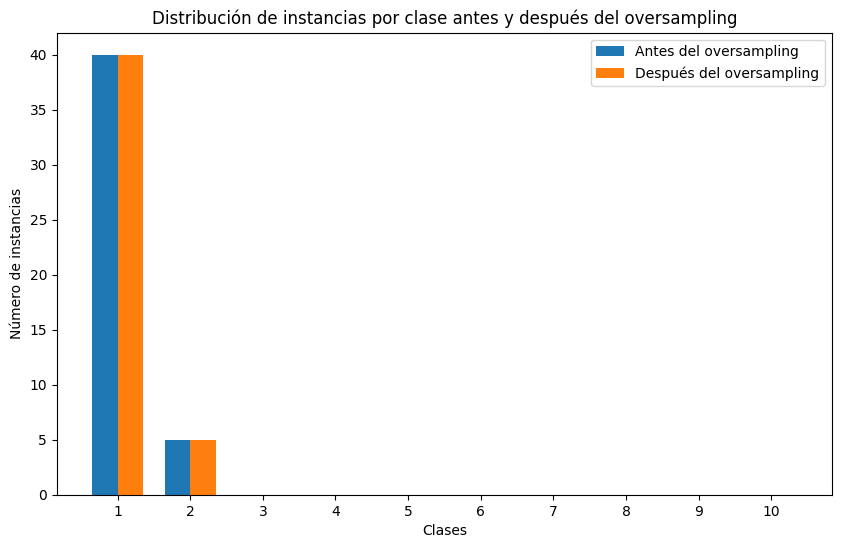

In [ ]:
import matplotlib.pyplot as plt

def plot_class_distribution(y_before, y_after):
    num_classes = len(y_before[0])  # Número de clases (número de columnas en las etiquetas)

    # Obtener la cantidad de instancias por clase antes y después del oversampling
    instances_before = [sum(1 for labels in y_before if labels[0][0] == class_idx) for class_idx in range(num_classes)]
    instances_after = [sum(1 for labels in y_after if labels[0][0] == class_idx) for class_idx in range(num_classes)]

    # Crear un gráfico de barras
    fig, ax = plt.subplots(figsize=(10, 6))
    bar_width = 0.35
    index = range(1, num_classes + 1)  # Corrección aquí: índices de 1 a num_classes

    # Barra antes del oversampling
    rects1 = plt.bar(index, instances_before, bar_width, label='Antes del oversampling')

    # Barra después del oversampling
    rects2 = plt.bar([i + bar_width for i in index], instances_after, bar_width, label='Después del oversampling')

    plt.xlabel('Clases')
    plt.ylabel('Número de instancias')
    plt.title('Distribución de instancias por clase antes y después del oversampling')
    plt.xticks([i + bar_width/2 for i in index], index)
    plt.legend()

    plt.show()

# Llamar a la función para visualizar la distribución de clases
plot_class_distribution(y_train, y_train_resampled)


In [ ]:
print("Shape of X_train:", X_train.shape)
print("Shape of X_train_resampled:", X_train_resampled.shape)


Shape of X_train: (45, 224, 224, 3)
Shape of X_train_resampled: (45, 150528)


Ejemplos de etiquetas antes del oversampling: [list([[0.0, 0.896755, 0.342903, 0.20059, 0.3755], [0.0, 0.265948, 0.119721, 0.082043, 0.189187], [0.0, 0.335085, 0.851324, 0.122603, 0.277794], [0.0, 0.274705, 0.636992, 0.123525, 0.318505], [0.0, 0.218013, 0.842942, 0.104167, 0.280188], [0.0, 0.198654, 0.634597, 0.063606, 0.203556], [0.0, 0.621313, 0.353211, 0.121681, 0.292162], [0.0, 0.653577, 0.687282, 0.15118, 0.395138], [1.0, 0.344303, 0.302921, 0.163164, 0.402322], [1.0, 0.787242, 0.675308, 0.147493, 0.3664]])
 list([[0.0, 0.087021, 0.606332, 0.150442, 0.258829], [0.0, 0.218781, 0.564768, 0.148476, 0.239937], [0.0, 0.337758, 0.596886, 0.111111, 0.20593], [0.0, 0.422321, 0.614834, 0.077679, 0.147363], [0.0, 0.453294, 0.50998, 0.084562, 0.153031], [0.0, 0.608653, 0.463693, 0.084562, 0.151141], [0.0, 0.532448, 0.532651, 0.075713, 0.119024], [0.0, 0.151917, 0.767865, 0.118977, 0.204041], [1.0, 0.26942, 0.761252, 0.127827, 0.292836], [0.0, 0.381514, 0.770698, 0.119961, 0.239937], [0.0, 0.

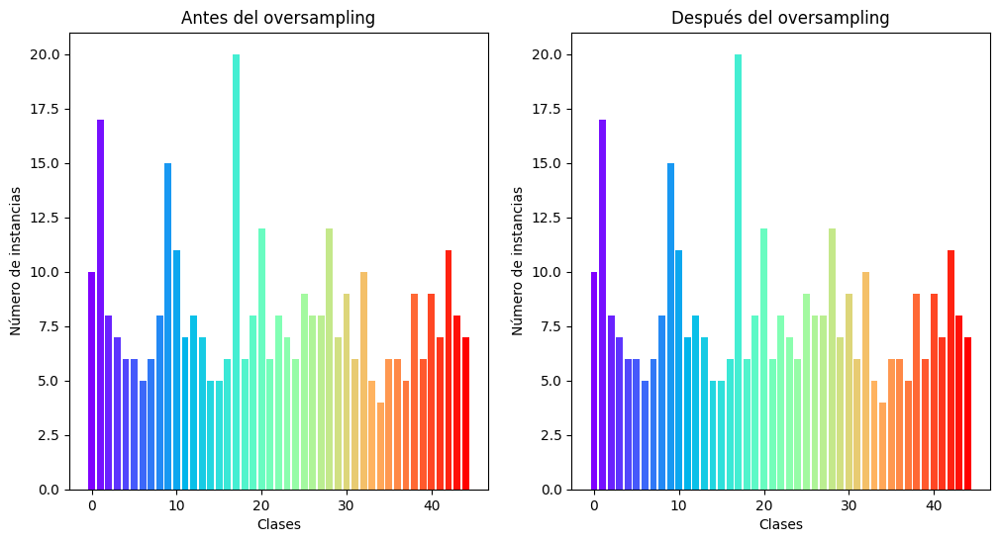

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Imprimir algunas etiquetas antes y después del oversampling para entender el formato
print("Ejemplos de etiquetas antes del oversampling:", y_train[:10])
print("Ejemplos de etiquetas después del oversampling:", y_train_resampled[:10])


def visualize_class_distribution_simple(y_before, y_after):
    # Obtener el número de clases
    num_classes_before = len(y_before)
    num_classes_after = len(y_after)

    # Crear colores aleatorios para cada clase
    colors_before = plt.cm.rainbow(np.linspace(0, 1, num_classes_before))
    colors_after = plt.cm.rainbow(np.linspace(0, 1, num_classes_after))

    # Crear una figura y ejes
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))

    # Graficar la distribución de clases antes del oversampling
    axs[0].bar(range(num_classes_before), [len(labels) for labels in y_before], color=colors_before)
    axs[0].set_title('Antes del oversampling')
    axs[0].set_xlabel('Clases')
    axs[0].set_ylabel('Número de instancias')

    # Graficar la distribución de clases después del oversampling
    axs[1].bar(range(num_classes_after), [len(labels) for labels in y_after], color=colors_after)
    axs[1].set_title('Después del oversampling')
    axs[1].set_xlabel('Clases')
    axs[1].set_ylabel('Número de instancias')

    # Mostrar la figura
    plt.show()

# Utiliza la función con tus datos
visualize_class_distribution_simple(y_train, y_train_resampled)


In [ ]:
from collections import Counter

# Función para visualizar la distribución de clases antes y después de oversampling
def visualize_class_distribution(y_before, y_after):
    # Convertir listas de etiquetas a tuplas
    y_before = [tuple(label) for label in y_before]
    y_after = [tuple(label) for label in y_after]

    # Contar ocurrencias de clases antes de oversampling
    counter_before = Counter(y_before)

    # Contar ocurrencias de clases después de oversampling
    counter_after = Counter(y_after)

    # Obtener etiquetas únicas
    unique_labels = set(counter_before.keys()).union(set(counter_after.keys()))

    # Crear listas de recuento de clases antes y después de oversampling
    count_before = [counter_before[label] for label in unique_labels]
    count_after = [counter_after[label] for label in unique_labels]

    # Crear un gráfico de barras para visualizar la distribución
    bar_width = 0.35
    index = np.arange(len(unique_labels))

    plt.bar(index, count_before, bar_width, label='Antes de Oversampling')
    plt.bar(index + bar_width, count_after, bar_width, label='Después de Oversampling')

    plt.xlabel('Clases')
    plt.ylabel('Número de instancias')
    plt.title('Distribución de Clases antes y después de Oversampling')
    plt.xticks(index + bar_width / 2, unique_labels)
    plt.legend()
    plt.show()

# ... (resto del código)

# Aplanar las instancias de X antes de concatenarlas
X_flattened = X_train.reshape(X_train.shape[0], -1)

# Visualizar la distribución de clases antes de oversampling
visualize_class_distribution(y_train, y_train)

# Aplicar ML-ROS a los conjuntos de entrenamiento
X_train_resampled, y_train_resampled = ml_ros(X_flattened, y_train, oversampling_factor=2)

# Visualizar la distribución de clases después de oversampling
visualize_class_distribution(y_train, y_train_resampled)

if X_train_resampled is not None and y_train_resampled is not None:
    print("Oversampling aplicado correctamente.")
else:
    print("Error durante la aplicación de oversampling.")


TypeError: unhashable type: 'list'

ValueError: setting an array element with a sequence.

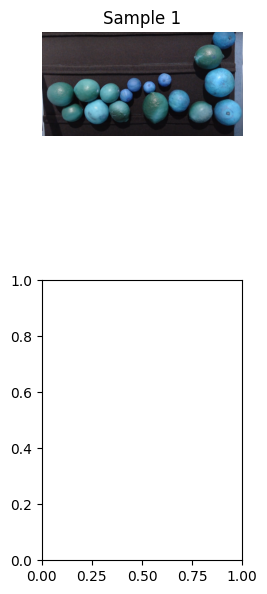

In [ ]:
import matplotlib.pyplot as plt
import random

# Función para visualizar algunas imágenes con etiquetas
def visualize_samples(X, y, num_samples=5):
    plt.figure(figsize=(15, 8))
    for i in range(num_samples):
        index = random.randint(0, len(X)-1)

        # Mostrar la imagen
        plt.subplot(2, num_samples, i+1)
        plt.imshow(X[index].astype(np.uint8))  # Convertir a uint8 para la visualización
        plt.title(f"Sample {index}")
        plt.axis('off')

        # Mostrar las etiquetas
        plt.subplot(2, num_samples, i+num_samples+1)
        plt.bar(range(len(y[index])), y[index])
        plt.title(f"Labels {index}")

    plt.show()

# Visualizar algunas muestras antes del oversampling
visualize_samples(X_train, y_train)

# Visualizar algunas muestras después del oversampling
visualize_samples(X_train_resampled.reshape(X_train_resampled.shape[0], -1), y_train_resampled)


In [ ]:
import cv2
import os

# Especificar la carpeta donde guardar los datos oversampleados
oversampled_data_folder = '/content/data/images/train_resampled/'

# Crear la carpeta si no existe
os.makedirs(oversampled_data_folder, exist_ok=True)



# Guardar las imágenes oversampleadas en la carpeta
for i, image in enumerate(X_train_resampled):
    # Convertir la imagen a tipo uint8
    image_uint8 = image.transpose(1, 2, 0).astype(np.uint8)  # Cambiar el orden de los canales
    cv2.imwrite(os.path.join(oversampled_data_folder, f"resampled_{i}.png"), image_uint8)



# Guardar las etiquetas oversampleadas en un nuevo archivo YAML
oversampled_data_path = '/content/drive/MyDrive/YOLOV5/custom2_resampled.yaml'

# Obtener las clases en formato YOLOv5
class_names = {idx: name for idx, name in enumerate(class_names)}

# Guardar el nuevo archivo de datos
with open(oversampled_data_path, 'w') as file:
    file.write("path: /content/data\n")
    file.write(f"train: {oversampled_data_folder}\n")
    file.write("val: /content/data/images/val\n")
    file.write("test:  # test images (optional)\n")
    file.write("\n")
    file.write("names:\n")
    for idx, name in class_names.items():
        file.write(f"  {idx}: {name}\n")



# Entrenar el modelo con el nuevo archivo de datos oversampleados
#!python train.py --img 640 --batch 4 --epochs 50 --data {oversampled_data_path} --weights yolov5x.pt --cache


(1,)


ValueError: axes don't match array

aparte


In [ ]:
import cv2

# Carga la imagen
image_path = '/content/drive/MyDrive/YOLOV5/prueba2.PNG'  # Cambia a la ruta de tu imagen
image = cv2.imread(image_path)

# Obtiene las dimensiones
height, width, channels = image.shape
print(f"Altura: {height}, Ancho: {width}, Canales: {channels}")


Altura: 636, Ancho: 1222, Canales: 3


In [ ]:
from PIL import Image
import numpy as np

for i, image in enumerate(X_train_resampled):
    # Verifica las dimensiones de la imagen antes de remodelar
    print(f"Dimensiones originales de la imagen {i}: {image.shape}")

    # Convierte el array NumPy a imagen PIL
    image_reshaped = np.reshape(image, (height, width, channels))  # Ajusta las dimensiones según tus datos

    # Guarda la imagen
    pil_image = Image.fromarray(image_reshaped.astype('uint8'))
    pil_image.save(os.path.join(resampled_images_folder, f"resampled_{i}.png"))



Dimensiones originales de la imagen 0: (1,)


ValueError: cannot reshape array of size 1 into shape (636,1222,3)

In [ ]:
import matplotlib.pyplot as plt

# Imprimir algunas estadísticas sobre las clases y distribución de instancias antes y después del oversampling
print("Antes del oversampling:")
print("Número de instancias por clase:", [len(labels) for labels in y_train])
print("Número total de instancias:", len(y_train))

print("\nDespués del oversampling:")
print("Número de instancias por clase:", [len(labels) for labels in y_train_resampled])
print("Número total de instancias:", len(y_train_resampled))

# Imprimir algunas imágenes y etiquetas resampleadas
for i in range(5):  # Mostrar las primeras 5 instancias resampleadas
    print("Imagen", i)
    plt.imshow(X_train_resampled[i])
    plt.show()
    print("Etiquetas:", y_train_resampled[i])


In [ ]:
# Train YOLOv5 using the resampled dataset
!python train.py --img 640 --batch 4 --epochs 50 --data /content/drive/MyDrive/YOLOV5/custom2.yaml --weights yolov5x.pt --cache

2024-01-23 19:03:15.972921: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-23 19:03:15.972993: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-23 19:03:15.974905: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5x.pt, cfg=, data=/content/drive/MyDrive/YOLOV5/custom2.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=4, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale